# Objective(s)

  * Predict protective stops
  * Predict current values (time series)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import os
import datetime

%matplotlib inline

# Data Exploration

In [2]:
# read in csv data
df = pd.read_csv('data/robot_data.csv')

In [3]:
df.head()

,datetimes,actual_q_0,actual_q_1,actual_q_2,actual_q_3,actual_q_4,actual_q_5,actual_qd_0,actual_qd_1,actual_qd_2,...,robot_mode,safety_mode,actual_robot_voltage,actual_robot_current,actual_joint_voltage_0,actual_joint_voltage_1,actual_joint_voltage_2,actual_joint_voltage_3,actual_joint_voltage_4,actual_joint_voltage_5
0,110320-16:14:40.386,-0.995936,-1.551253,-1.699221,-1.451689,1.577951,-1.023975,-0.001299,-0.061588,-0.578393,...,7,1,47.961834,0.907506,47.699596,47.871586,47.814255,47.699596,47.756924,47.742592
1,110320-16:14:40.394,-0.995912,-1.551781,-1.703696,-1.446541,1.577999,-1.023951,-0.001857,-0.065664,-0.575498,...,7,1,47.911674,0.932121,47.713928,47.814255,47.828590,47.685261,47.699596,47.756924
2,110320-16:14:40.402,-0.995972,-1.552358,-1.708190,-1.441397,1.577963,-1.023951,-0.002427,-0.071450,-0.571337,...,7,1,47.925110,0.923173,47.713928,47.857254,47.828590,47.742592,47.742592,47.756924
3,110320-16:14:40.410,-0.995996,-1.552911,-1.712737,-1.436238,1.577939,-1.023938,-0.002259,-0.074911,-0.565964,...,7,1,47.944820,0.932121,47.728260,47.885921,47.799923,47.685261,47.742592,47.785591
4,110320-16:14:40.418,-0.996008,-1.553511,-1.717313,-1.431185,1.577986,-1.023891,-0.002221,-0.078184,-0.570142,...,7,1,47.951981,0.809034,47.728260,47.857254,47.900253,47.685261,47.742592,47.742592


In [4]:
df.describe()

,actual_q_0,actual_q_1,actual_q_2,actual_q_3,actual_q_4,actual_q_5,actual_qd_0,actual_qd_1,actual_qd_2,actual_qd_3,...,robot_mode,safety_mode,actual_robot_voltage,actual_robot_current,actual_joint_voltage_0,actual_joint_voltage_1,actual_joint_voltage_2,actual_joint_voltage_3,actual_joint_voltage_4,actual_joint_voltage_5
count,74300.000000,74300.000000,74300.000000,74300.000000,74300.000000,74300.000000,74300.000000,74300.000000,74300.000000,74300.000000,...,74300.0,74300.000000,74300.000000,74300.000000,74300.000000,74300.000000,74300.000000,74300.000000,74300.000000,74300.000000
mean,-0.991379,-1.744431,-1.719629,-1.118333,1.432635,-1.037796,0.000346,-0.000376,0.000012,0.001242,...,7.0,1.025976,47.863601,1.295592,47.619444,47.755406,47.721152,47.602612,47.620492,47.626980
std,0.402524,0.237716,0.293524,0.260649,0.246148,0.388331,0.463527,0.348982,0.497194,0.442166,...,0.0,0.226445,0.057313,0.311468,0.089424,0.096262,0.097145,0.100269,0.101884,0.102418
min,-1.607093,-2.219949,-2.163062,-1.651520,0.851246,-1.633963,-0.800212,-0.594302,-1.446819,-1.059248,...,7.0,1.000000,47.587475,-0.278632,47.126282,47.240944,47.197945,47.040287,47.054619,47.068951
25%,-1.318411,-1.918978,-1.967183,-1.304689,1.364834,-1.345820,-0.286947,-0.182560,-0.240275,-0.179311,...,7.0,1.000000,47.839134,1.102209,47.584930,47.713928,47.670929,47.556263,47.570595,47.584930
50%,-0.995828,-1.639159,-1.806672,-1.114941,1.577556,-1.022885,-0.025268,0.003129,0.051446,0.001185,...,7.0,1.000000,47.870480,1.254394,47.627930,47.771259,47.728260,47.613598,47.627930,47.642265
75%,-0.695083,-1.589525,-1.495785,-1.076051,1.581086,-0.807192,0.049729,0.097611,0.333682,0.287849,...,7.0,1.000000,47.900932,1.399861,47.670929,47.814255,47.785591,47.670929,47.685261,47.699596
max,-0.164600,-1.430576,-1.156746,-0.564794,1.584484,-0.197552,1.322096,1.260351,0.964136,0.768165,...,7.0,3.000000,51.297924,3.270822,51.311462,51.569450,51.655449,51.512119,51.540783,51.569450


In [5]:
df.select_dtypes(include=['object'])

,datetimes
0,110320-16:14:40.386
1,110320-16:14:40.394
2,110320-16:14:40.402
3,110320-16:14:40.410
4,110320-16:14:40.418
...,...
74295,110320-16:24:40.357
74296,110320-16:24:40.365
74297,110320-16:24:40.373
74298,110320-16:24:40.381


In [6]:
# convert datetimes column to datetime datatype
df['datetimes'] = df['datetimes'].map(lambda x: datetime.datetime.strptime(x, "%d%m%y-%H:%M:%S.%f"))

In [7]:
# create column of interval times
intervals = np.zeros(df.shape[0])
print(intervals.shape)

# # exploring dimension expansion
# it = np.expand_dims(intervals, axis=1)
# print(it.shape)

for i, dt in enumerate(df['datetimes']):
    if i == 0:
        prev_dt = dt
        continue
        
    intervals[i] = (intervals[i-1] + ((dt - prev_dt).microseconds / 1e6))
    
    prev_dt = dt
    
print(intervals[:5])

# convert to series
intervals = pd.Series(intervals)

# create new column
df.insert(0, "time", intervals)
df.head()

(74300,)
[0.    0.008 0.016 0.024 0.032]


,time,datetimes,actual_q_0,actual_q_1,actual_q_2,actual_q_3,actual_q_4,actual_q_5,actual_qd_0,actual_qd_1,...,robot_mode,safety_mode,actual_robot_voltage,actual_robot_current,actual_joint_voltage_0,actual_joint_voltage_1,actual_joint_voltage_2,actual_joint_voltage_3,actual_joint_voltage_4,actual_joint_voltage_5
0,0.000,2020-03-11 16:14:40.386,-0.995936,-1.551253,-1.699221,-1.451689,1.577951,-1.023975,-0.001299,-0.061588,...,7,1,47.961834,0.907506,47.699596,47.871586,47.814255,47.699596,47.756924,47.742592
1,0.008,2020-03-11 16:14:40.394,-0.995912,-1.551781,-1.703696,-1.446541,1.577999,-1.023951,-0.001857,-0.065664,...,7,1,47.911674,0.932121,47.713928,47.814255,47.828590,47.685261,47.699596,47.756924
2,0.016,2020-03-11 16:14:40.402,-0.995972,-1.552358,-1.708190,-1.441397,1.577963,-1.023951,-0.002427,-0.071450,...,7,1,47.925110,0.923173,47.713928,47.857254,47.828590,47.742592,47.742592,47.756924
3,0.024,2020-03-11 16:14:40.410,-0.995996,-1.552911,-1.712737,-1.436238,1.577939,-1.023938,-0.002259,-0.074911,...,7,1,47.944820,0.932121,47.728260,47.885921,47.799923,47.685261,47.742592,47.785591
4,0.032,2020-03-11 16:14:40.418,-0.996008,-1.553511,-1.717313,-1.431185,1.577986,-1.023891,-0.002221,-0.078184,...,7,1,47.951981,0.809034,47.728260,47.857254,47.900253,47.685261,47.742592,47.742592


# Data Cleaning

`robot_mode` and `safety_mode` are actually categorical features, but treated as numeric.

For `robot_mode`:
  * -1: no controller
  * 0: disconnected
  * 1: confirming safety
  * 2: booting
  * 3: power off
  * 4: power on
  * 5: idle mode
  * 6: backdrive
  * 7: running
  * 8: updating firmware
  
For `safety_mode`:
  * 1: normal
  * 2: reduced
  * 3: protective stop
  * 4: recovery
  * 5: safeguard stop
  * 6: system e-stop
  * 7: robot e-stop
  * 8: violation
  * 9: fault
  * 10: validate joint id
  * 11: undefined safety mode
  * 12: automatic mode safeguard stop
  * 13: three position enabling stop

For the purpose of our objective, which is to anticipate protective stops / fault based on based on the other features, we are only concerned with `safety_mode` values and not `robot_mode`, since we are implementing this model when the robot is always 'running' (7) or 'power on' (4).

For `safety_mode`, the numbers of concern to us are **'1' and '3', '8' or '9'**. The other modes are triggered manually. 

In [8]:
# drop unwanted columns, also drop datetimes
df.drop(['datetimes', 'robot_mode'], axis=1, inplace=True)

In [9]:
df['safety_mode']

0        1
1        1
2        1
3        1
4        1
        ..
74295    1
74296    1
74297    1
74298    1
74299    1
Name: safety_mode, Length: 74300, dtype: int64

In [10]:
def change_to_category(x):
    # if x is not normal
    if x == 1:
        x = 0
    else:
        x = 1
#     if x == 1:
#         x = 'normal'
#     elif x == 3:
#         x = 'protective_stop'
#     elif x == 8:
#         x = 'violation'
#     elif x == 9:
#         x = 'fault'
#     else:
#         x = 'error'
        
    return x
        
df['safety_mode'] = df['safety_mode'].apply(change_to_category)
df['safety_mode'].head()

0    0
1    0
2    0
3    0
4    0
Name: safety_mode, dtype: int64

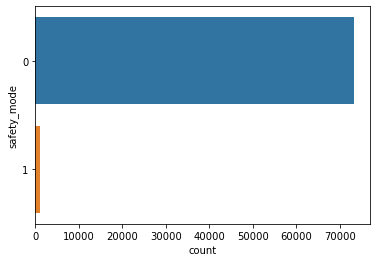

In [11]:
sns.countplot(y='safety_mode', data=df)
plt.show()

# Feature Engineering

First, we create columns for joint acceleration

In [12]:
base_acc = np.zeros(df.shape[0])
shoulder_acc = np.zeros(df.shape[0])
elbow_acc = np.zeros(df.shape[0])
wrist1_acc = np.zeros(df.shape[0])
wrist2_acc = np.zeros(df.shape[0])
wrist3_acc = np.zeros(df.shape[0])

def get_acceleration(array, joint):
    for i, vel in enumerate(df[f'actual_qd_{joint}']):
        if i == 0:
            prev_vel = vel
            continue
        
        d_time = float(df['time'][i] - df['time'][i-1])
        
        # assume time difference is 0.008 if we get equal values
        if d_time == 0.0:
            d_time = 0.008
        
        d_vel = vel - prev_vel
        
        acc = d_vel / d_time            
        
        array[i] = acc
        
        prev_vel = vel
        
    return array
        
base_acc_series = pd.Series(get_acceleration(base_acc, 0))
shoulder_acc_series = pd.Series(get_acceleration(shoulder_acc, 1))
elbow_acc_series = pd.Series(get_acceleration(elbow_acc, 2))
wrist1_acc_series = pd.Series(get_acceleration(wrist1_acc, 3))
wrist2_acc_series = pd.Series(get_acceleration(wrist2_acc, 4))
wrist3_acc_series = pd.Series(get_acceleration(wrist3_acc, 5))

In [13]:
df.insert(13, 'actual_qdd_0', base_acc_series)
df.insert(14, 'actual_qdd_1', shoulder_acc_series)
df.insert(15, 'actual_qdd_2', elbow_acc_series)
df.insert(16, 'actual_qdd_3', wrist1_acc_series)
df.insert(17, 'actual_qdd_4', wrist2_acc_series)
df.insert(18, 'actual_qdd_5', wrist3_acc_series)

df.iloc[:, 13:19].head()

,actual_qdd_0,actual_qdd_1,actual_qdd_2,actual_qdd_3,actual_qdd_4,actual_qdd_5
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,-0.069787,-0.509453,0.361890,0.915952,-0.002321,-0.045168
2,-0.071254,-0.723255,0.520170,0.464655,-0.019914,0.055916
3,0.021081,-0.432701,0.671543,0.244349,-0.049495,0.007311
4,0.004726,-0.409127,-0.522241,-1.093596,0.035236,-0.056341


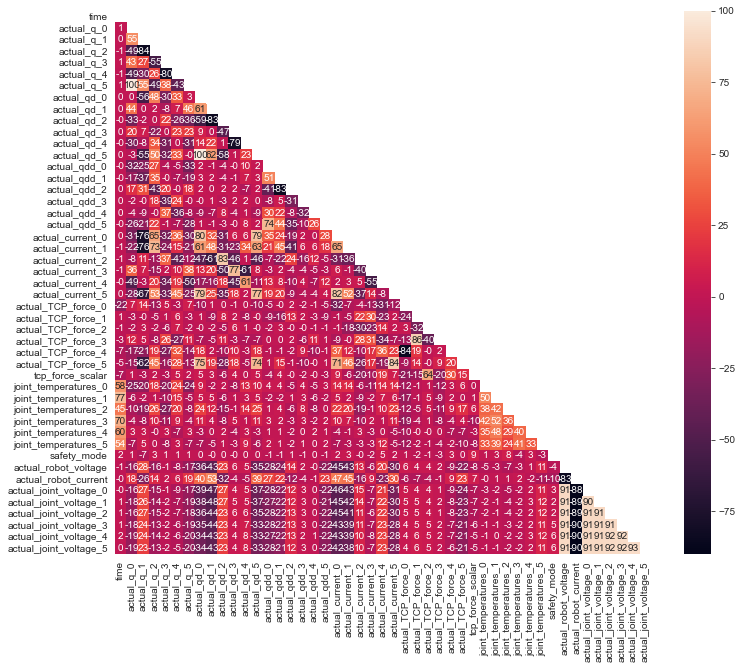

In [14]:
# correlation matrix. Only affects numerical data
correlations = df.corr()

# change color scheme
sns.set_style('white')

# generate a mask for upper triangle
mask = np.zeros_like(correlations, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# make the figsize 12x10
plt.figure(figsize=(12,10))

# plot heatmap
sns.heatmap(correlations * 100,
           annot=True,
           fmt='.0f',
           mask=mask,
           cbar=True)

plt.show()

# Data Preparation

Create a function that cleans and engineer features in the raw robot csv data.

In [15]:
def prepare_data(filepath):
    df = pd.read_csv(filepath)
    
    # convert datetimes column to datetime datatype
    df['datetimes'] = df['datetimes'].map(lambda x: datetime.datetime.strptime(x, "%d%m%y-%H:%M:%S.%f"))
    
    # create column of interval times
    intervals = np.zeros(df.shape[0])
    
    for i, dt in enumerate(df['datetimes']):
        if i == 0:
            prev_dt = dt
            continue

        intervals[i] = (intervals[i-1] + ((dt - prev_dt).microseconds / 1e6))

        prev_dt = dt
        
    # convert to series
    intervals = pd.Series(intervals)

    # create new column
    df.insert(0, "time", intervals)    
    
    # change to categorical feature
    def change_to_category(x):
        if x == 1:
            x = 0
        else:
            x = 1

        return x
        
    df['safety_mode'] = df['safety_mode'].apply(change_to_category)
    
    
    # get accelerations
    base_acc = np.zeros(df.shape[0])
    shoulder_acc = np.zeros(df.shape[0])
    elbow_acc = np.zeros(df.shape[0])
    wrist1_acc = np.zeros(df.shape[0])
    wrist2_acc = np.zeros(df.shape[0])
    wrist3_acc = np.zeros(df.shape[0])

    def get_acceleration(array, joint):
        for i, vel in enumerate(df[f'actual_qd_{joint}']):
            if i == 0:
                prev_vel = vel
                continue

            d_time = df['time'][i] - df['time'][i-1]
            
            if d_time == 0.0:
                d_time = 0.008
                
            d_vel = vel - prev_vel

            acc = d_vel / d_time

            array[i] = acc

            prev_vel = vel

        return array

    base_acc_series = pd.Series(get_acceleration(base_acc, 0))
    shoulder_acc_series = pd.Series(get_acceleration(shoulder_acc, 1))
    elbow_acc_series = pd.Series(get_acceleration(elbow_acc, 2))
    wrist1_acc_series = pd.Series(get_acceleration(wrist1_acc, 3))
    wrist2_acc_series = pd.Series(get_acceleration(wrist2_acc, 4))
    wrist3_acc_series = pd.Series(get_acceleration(wrist3_acc, 5))
    
    df.insert(13, 'actual_qdd_0', base_acc_series)
    df.insert(14, 'actual_qdd_1', shoulder_acc_series)
    df.insert(15, 'actual_qdd_2', elbow_acc_series)
    df.insert(16, 'actual_qdd_3', wrist1_acc_series)
    df.insert(17, 'actual_qdd_4', wrist2_acc_series)
    df.insert(18, 'actual_qdd_5', wrist3_acc_series)
    
    # drop unwanted columns, also drop datetimes
    df.drop(['datetimes', 'robot_mode', 'time'], axis=1, inplace=True)
    
    # drop duplicated data
    df = df.drop_duplicates()
    
    return df

In [16]:
# test out function
filepath = 'data/robot_data.csv'
df_prepared = prepare_data(filepath)

In [17]:
df_prepared.head()

,actual_q_0,actual_q_1,actual_q_2,actual_q_3,actual_q_4,actual_q_5,actual_qd_0,actual_qd_1,actual_qd_2,actual_qd_3,...,joint_temperatures_5,safety_mode,actual_robot_voltage,actual_robot_current,actual_joint_voltage_0,actual_joint_voltage_1,actual_joint_voltage_2,actual_joint_voltage_3,actual_joint_voltage_4,actual_joint_voltage_5
0,-0.995936,-1.551253,-1.699221,-1.451689,1.577951,-1.023975,-0.001299,-0.061588,-0.578393,0.635038,...,39.9375,0,47.961834,0.907506,47.699596,47.871586,47.814255,47.699596,47.756924,47.742592
1,-0.995912,-1.551781,-1.703696,-1.446541,1.577999,-1.023951,-0.001857,-0.065664,-0.575498,0.642366,...,39.9375,0,47.911674,0.932121,47.713928,47.814255,47.828590,47.685261,47.699596,47.756924
2,-0.995972,-1.552358,-1.708190,-1.441397,1.577963,-1.023951,-0.002427,-0.071450,-0.571337,0.646083,...,39.9375,0,47.925110,0.923173,47.713928,47.857254,47.828590,47.742592,47.742592,47.756924
3,-0.995996,-1.552911,-1.712737,-1.436238,1.577939,-1.023938,-0.002259,-0.074911,-0.565964,0.648038,...,39.9375,0,47.944820,0.932121,47.728260,47.885921,47.799923,47.685261,47.742592,47.785591
4,-0.996008,-1.553511,-1.717313,-1.431185,1.577986,-1.023891,-0.002221,-0.078184,-0.570142,0.639289,...,39.9375,0,47.951981,0.809034,47.728260,47.857254,47.900253,47.685261,47.742592,47.742592


## Analytical Base Table
Finally, save the new DataFrame that we've cleaned and then augmented through feature engineering. 

This is the dataframe that we will be building our models on.

In [18]:
df_prepared.to_csv('analytical_base_table.csv', index=None)

# Model Training

In [19]:
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import roc_curve, auc

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

from sklearn.cluster import KMeans, MiniBatchKMeans

from sklearn.decomposition import PCA


In [20]:
# load the cleaned and augmented dataset
df = pd.read_csv('analytical_base_table.csv')
df.head()

,actual_q_0,actual_q_1,actual_q_2,actual_q_3,actual_q_4,actual_q_5,actual_qd_0,actual_qd_1,actual_qd_2,actual_qd_3,...,joint_temperatures_5,safety_mode,actual_robot_voltage,actual_robot_current,actual_joint_voltage_0,actual_joint_voltage_1,actual_joint_voltage_2,actual_joint_voltage_3,actual_joint_voltage_4,actual_joint_voltage_5
0,-0.995936,-1.551253,-1.699221,-1.451689,1.577951,-1.023975,-0.001299,-0.061588,-0.578393,0.635038,...,39.9375,0,47.961834,0.907506,47.699596,47.871586,47.814255,47.699596,47.756924,47.742592
1,-0.995912,-1.551781,-1.703696,-1.446541,1.577999,-1.023951,-0.001857,-0.065664,-0.575498,0.642366,...,39.9375,0,47.911674,0.932121,47.713928,47.814255,47.828590,47.685261,47.699596,47.756924
2,-0.995972,-1.552358,-1.708190,-1.441397,1.577963,-1.023951,-0.002427,-0.071450,-0.571337,0.646083,...,39.9375,0,47.925110,0.923173,47.713928,47.857254,47.828590,47.742592,47.742592,47.756924
3,-0.995996,-1.552911,-1.712737,-1.436238,1.577939,-1.023938,-0.002259,-0.074911,-0.565964,0.648038,...,39.9375,0,47.944820,0.932121,47.728260,47.885921,47.799923,47.685261,47.742592,47.785591
4,-0.996008,-1.553511,-1.717313,-1.431185,1.577986,-1.023891,-0.002221,-0.078184,-0.570142,0.639289,...,39.9375,0,47.951981,0.809034,47.728260,47.857254,47.900253,47.685261,47.742592,47.742592


## Dimensionality Reduction using PCA
PCA attempts to reduce the number of features within a dataset while retaining the 'principal components' (**weighted, linear combinations of existing features** that are designed to be **linearly independent** and account for the **largest possible variance** in the data). 

It can be thought of as taking many features and combining similar or redundant features together to form a new, smaller feature set.

In [21]:
# sklearn only operates on numbers and not strings, hence prepare multi-class labels to the required format
print(pd.factorize(df['safety_mode'])[0], pd.factorize(df['safety_mode'])[1])

df['safety_mode'] = pd.Categorical(pd.factorize(df['safety_mode'])[0])
# df['safety_mode'] = pd.factorize(df['safety_mode'])[0]

[0 0 0 ... 0 0 0] Int64Index([0, 1], dtype='int64')


In [22]:
pca = PCA(random_state=42)
robot_pca = pca.fit_transform(df)

### PCA Model Attributes

3 types of model attributes are contained within the PCA model.

  * mean: The mean that was subtracted from a component in order to center it
  * components_: The features that make up each of the components
  * explained_variance_ratio_: the percentage of the total data's variance captured by each of the generated principal components
  
We are only interested in **components_** and **explained_variance_ratio__**.

In [23]:
num_components = len(pca.explained_variance_ratio_)
num_components

46

In [24]:
# get the array of percentages from the fit pca object
vals = pca.explained_variance_ratio_

# get the array of cumulative captured variance
cumvals = np.cumsum(vals)

In practice, we aim for a number of principal components that can capture **80-90%** variance.

In [25]:
# trial and error
top_n_components = 3

# get the cumulative variance from the top n components
captured_variance = cumvals[top_n_components]

print(f"The top {top_n_components} principal components captured {captured_variance} of the total variance.")

The top 3 principal components captured 0.8012657644942629 of the total variance.


From trial-and-error, we can see that only 3 principal components for the pca-transformed dataset accounts for 95% of our total variance.

**Hence it might not be necessary to perform PCA as our original data exhibits enough variance.**

### Clustering using KMeans
We will cluster the data using the KMeans algorithm to see if we can draw additional insights from the data.

In [26]:
kmeans_scores = []


for i in range(2, 21, 1):
    kmeans = make_pipeline(StandardScaler(), MiniBatchKMeans(i, random_state=42))
    kmeans.fit(df)
    score = np.abs(kmeans.score(df))
    print(f'For {i} clusters, average point-to-centroid distances = {score}')
    kmeans_scores.append(score)

For 2 clusters, average point-to-centroid distances = 3138564.9162912657
For 3 clusters, average point-to-centroid distances = 2616645.444563125
For 4 clusters, average point-to-centroid distances = 2448936.662204706
For 5 clusters, average point-to-centroid distances = 2319103.5305564213
For 6 clusters, average point-to-centroid distances = 2082270.5877292354
For 7 clusters, average point-to-centroid distances = 2101075.0284950756
For 8 clusters, average point-to-centroid distances = 1876161.398625125
For 9 clusters, average point-to-centroid distances = 1783165.0767609612
For 10 clusters, average point-to-centroid distances = 1704022.5115360417
For 11 clusters, average point-to-centroid distances = 1612630.0093961847
For 12 clusters, average point-to-centroid distances = 1553276.153746299
For 13 clusters, average point-to-centroid distances = 1571571.3586226974
For 14 clusters, average point-to-centroid distances = 1410175.0657309256
For 15 clusters, average point-to-centroid distanc

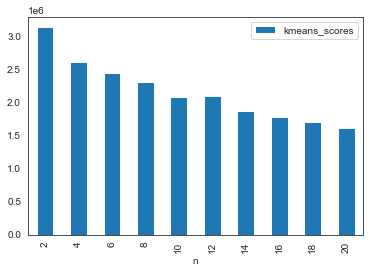

In [27]:
# plot a graph to visualize the change in intra-cluster distance across the different cluster number parameters

n = list(range(2, 22, 2))
cluster_df = pd.DataFrame(list(zip(kmeans_scores, n)))

# name the columns
cluster_df.columns = ['kmeans_scores', 'n']

cluster_df.plot.bar(x='n', y='kmeans_scores')

Choose **14 clusters** to segment the population, since after 14 clusters, the **rate of decrease in the avg distance** is smaller. Hence the additional benefit from using additional clusters beyond this point is smaller due to the law of diminishing returns.

In [28]:
%%time
# refit the kmeans model with the selected number of clusters
kmeans = make_pipeline(StandardScaler(), MiniBatchKMeans(10, random_state=42))
# predict the clusters
clusters_robot = kmeans.fit_predict(df)

Wall time: 770 ms


#### Inspecting the array of clusters

In [29]:
clusters_robot_df = pd.DataFrame(clusters_robot, columns=['Cluster'])

In [30]:
clusters_robot_df.head()

,Cluster
0,1
1,1
2,1
3,1
4,1


#### Visualizing proportion of data in each of the clusters

In [31]:
num_clusters= 10

robot_df_prop = []

for i in range(num_clusters):
   
    robot_df_prop_i = len(clusters_robot_df[clusters_robot_df['Cluster'] == i]) / len(clusters_robot_df) * 100

    robot_df_prop.append(robot_df_prop_i)
    

cluster_list = list(range(0, num_clusters))

prop_df = pd.DataFrame(list(zip(cluster_list, robot_df_prop)), columns=['cluster', 'proportion%'])

prop_df

,cluster,proportion%
0,0,8.269179
1,1,17.695828
2,2,14.515478
3,3,8.059219
4,4,13.247645
5,5,10.547779
6,6,11.651413
7,7,4.842530
8,8,0.518170
9,9,10.652759


## Supervised Learning Model

### Split dataset

In [32]:
y = df['safety_mode']
X = df.drop(['safety_mode'], axis=1)

# split X and y into train and test sets. Ensure usage of stratification to obtain even splits between the different classes
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y, 
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify=y)

### Create pipeline and hyperparameter dictionaries

In [33]:
# pipelines
pipelines = {
    'rf': make_pipeline(StandardScaler(), RandomForestClassifier(random_state=42)),
    'gb': make_pipeline(StandardScaler(), GradientBoostingClassifier(random_state=42))
}

# Create hyperparameter grids
rf_hyperparameters = {
    'randomforestclassifier__n_estimators': [100, 200],
    'randomforestclassifier__max_features': ['auto', 'sqrt', 0.33]
}

gb_hyperparameters = {
    'gradientboostingclassifier__n_estimators': [100, 200],
    'gradientboostingclassifier__learning_rate': [0.05, 0.1, 0.2],
    'gradientboostingclassifier__max_depth': [1, 3, 5]
}

# create hyperparameter dictionary
hyperparameters = {
    'rf': rf_hyperparameters,
    'gb': gb_hyperparameters
}

### Fit and tune the models using Grid Search

In [34]:
%%time

fitted_models = {}
# 10-fold cross validation
for name, pipeline in pipelines.items():
    model = GridSearchCV(pipeline, hyperparameters[name], cv=10, n_jobs=-1)
    
    # fit model on X_train, y_train
    model.fit(X_train, y_train)
    
    # store inside model dictionary
    fitted_models[name] = model
    
    print(f'{name} has been fitted!')

rf has been fitted!
gb has been fitted!
Wall time: 1h 49min 43s


### Select winner with best cross-validated score

In [35]:
for name, model in fitted_models.items():
    print(name, model.best_score_)

rf 0.9990242261103633
gb 0.9983176312247645


In [36]:
for name, model in fitted_models.items():
    print(name, model.best_params_)

rf {'randomforestclassifier__max_features': 'auto', 'randomforestclassifier__n_estimators': 200}
gb {'gradientboostingclassifier__learning_rate': 0.05, 'gradientboostingclassifier__max_depth': 5, 'gradientboostingclassifier__n_estimators': 200}


# Evaluate Model

For classification tasks, we use **AUROC** as an evaluation metric, which handles imbalanced classes too.

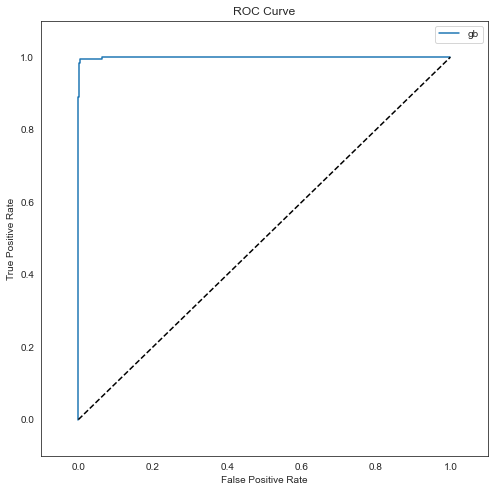

In [37]:
# We choose gb as our go-to classifier

pred = fitted_models['gb'].predict_proba(X_test)
pred = [p[1] for p in pred]

# pred = fitted_models['gb'].predict(X_test)

fpr, tpr, thresholds = roc_curve(y_test, pred)

fig = plt.figure(figsize=(8, 8))
plt.title('ROC Curve')

# plot the ROC curve
plt.plot(fpr, tpr, label='gb')
plt.legend(loc='upper right')

# diagonal 45 degree dotted line
plt.plot([0, 1], [0, 1], 'k--')

# axes limits and labels
plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()    

In [38]:
# calculate the AUROC
area_under_curve = auc(fpr, tpr)
print(f"Area under ROC curve: {area_under_curve}")

Area under ROC curve: 0.9995124934160116


In [39]:
from sklearn.metrics import confusion_matrix

pred = fitted_models['gb'].predict(X_test)

# confusion matrix
print(confusion_matrix(y_test, pred))

[[14659     8]
 [   17   176]]


There are 639 true positives, and 95 true negatives.

There is 1 false positive and 2 false negatives.

This means that of all the observations that were actually positive, 639 were predicted to be positive. Of all the observations that were actually negative, 95 were predicted to be negative.

# Save the Winning Model

In [40]:
import pickle

with open('final_model.pkl', 'wb') as f:
    pickle.dump(fitted_models['gb'].best_estimator_, f)

# Graph Plots for Visualization

In [41]:
import plotly.graph_objs as go

In [42]:
def prepare_data_for_plots(filepath):
    df = pd.read_csv(filepath)
    
    # convert datetimes column to datetime datatype
    df['datetimes'] = df['datetimes'].map(lambda x: datetime.datetime.strptime(x, "%d%m%y-%H:%M:%S.%f"))
    
    # create column of interval times
    intervals = np.zeros(df.shape[0])
    
    for i, dt in enumerate(df['datetimes']):
        if i == 0:
            prev_dt = dt
            continue

        intervals[i] = (intervals[i-1] + ((dt - prev_dt).microseconds / 1e6))

        prev_dt = dt
        
    # convert to series
    intervals = pd.Series(intervals)

    # create new column
    df.insert(0, "time", intervals)    
    
    # change to categorical feature
    def change_to_category(x):
        if x == 1:
            x = 0
        else:
            x = 1

        return x
        
    df['safety_mode'] = df['safety_mode'].apply(change_to_category)
    
    
    # get accelerations
    base_acc = np.zeros(df.shape[0])
    shoulder_acc = np.zeros(df.shape[0])
    elbow_acc = np.zeros(df.shape[0])
    wrist1_acc = np.zeros(df.shape[0])
    wrist2_acc = np.zeros(df.shape[0])
    wrist3_acc = np.zeros(df.shape[0])

    def get_acceleration(array, joint):
        for i, vel in enumerate(df[f'actual_qd_{joint}']):
            if i == 0:
                prev_vel = vel
                continue

            d_time = df['time'][i] - df['time'][i-1]
            
            if d_time == 0.0:
                d_time = 0.008
                
            d_vel = vel - prev_vel

            acc = d_vel / d_time

            array[i] = acc

            prev_vel = vel

        return array

    base_acc_series = pd.Series(get_acceleration(base_acc, 0))
    shoulder_acc_series = pd.Series(get_acceleration(shoulder_acc, 1))
    elbow_acc_series = pd.Series(get_acceleration(elbow_acc, 2))
    wrist1_acc_series = pd.Series(get_acceleration(wrist1_acc, 3))
    wrist2_acc_series = pd.Series(get_acceleration(wrist2_acc, 4))
    wrist3_acc_series = pd.Series(get_acceleration(wrist3_acc, 5))
    
    df.insert(13, 'actual_qdd_0', base_acc_series)
    df.insert(14, 'actual_qdd_1', shoulder_acc_series)
    df.insert(15, 'actual_qdd_2', elbow_acc_series)
    df.insert(16, 'actual_qdd_3', wrist1_acc_series)
    df.insert(17, 'actual_qdd_4', wrist2_acc_series)
    df.insert(18, 'actual_qdd_5', wrist3_acc_series)
    
    # drop unwanted columns, also drop datetimes
    df.drop(['datetimes', 'robot_mode'], axis=1, inplace=True)
    
    # drop duplicated data
    df = df.drop_duplicates()
    
    return df

In [43]:
df = prepare_data_for_plots('../web_app/data/robot_data.csv')

time = df['time'].tolist()

# first chart plots joint currents vs time as a line chart

graph_one = []


graph_one.append([

    go.Scatter(
        x = time,
        y = df['actual_current_0'].tolist(),
        mode = 'lines',
        name = 'base'),
    
    go.Scatter(
        x = time,
        y = df['actual_current_1'].tolist(),
        mode = 'lines',
        name = 'shoulder'),
    go.Scatter(
        x = time,
        y = df['actual_current_2'].tolist(),
        mode = 'lines',
        name = 'elbow'),
    go.Scatter(
        x = time,
        y = df['actual_current_3'].tolist(),
        mode = 'lines',
        name = 'wrist_1'),
    go.Scatter(
        x = time,
        y = df['actual_current_4'].tolist(),
        mode = 'lines',
        name = 'wrist_2'),
    go.Scatter(
        x = time,
        y = df['actual_current_5'].tolist(),
        mode = 'lines',
        name = 'wrist_3')


])

layout_one = dict(title = 'Graph of Joint Currents vs Time',
                    xaxis = dict(title = 'Time'),
                    yaxis = dict(title = 'Joint Currents (A)'),
                 )

In [44]:
# sixth chart plots tcp force vs time as a line chart
graph_six = []

graph_six.append(

    go.Scatter(
        x = time,
        y = df['tcp_force_scalar'].tolist(),
        mode = 'lines',
        name = 'force')
)

layout_six = dict(title = 'Graph of TCP Force vs Time',
                    xaxis = dict(title = 'Time'),
                    yaxis = dict(title = 'TCP Force(N)'),
                 )
    

In [45]:
# seventh chart plots percentage of the different'safety mode' occurrences as a bar chart    
graph_seven = []

classes = df['safety_mode'].unique()

safety_mode_list = []

for label in classes:
    safety_mode_list.append(len(df[df['safety_mode']==label]) / len(df) * 100)

graph_seven.append(
  go.Bar(
  x = classes,
  y = safety_mode_list,
  )
)

layout_seven = dict(title = 'Safety Mode Types Occurrence (%)',
                    xaxis = dict(title = 'Safety Mode Type',),
                    yaxis = dict(title = 'Occurrence (%)'),
                    )

In [46]:
fig = go.Figure()
for i, plot in enumerate(graph_six):
    fig.add_trace(plot)

fig.update_layout(layout_six)
fig.show()

In [47]:
fig = go.Figure()
for i, plot in enumerate(graph_seven):
    fig.add_trace(plot)

fig.update_layout(layout_seven)
fig.show()

# Predict

Attempt to predict batched data.

In [48]:
def prepare_batched_data(filepath):
    df = pd.read_csv(filepath)
    
    df = df.iloc[:3, :]
    
    # convert datetimes column to datetime datatype
    df['datetimes'] = df['datetimes'].map(lambda x: datetime.datetime.strptime(x, "%d%m%y-%H:%M:%S.%f"))
    
    # create column of interval times
    intervals = np.zeros(df.shape[0])
    
    for i, dt in enumerate(df['datetimes']):
        if i == 0:
            prev_dt = dt
            continue

        intervals[i] = (intervals[i-1] + ((dt - prev_dt).microseconds / 1e6))

        prev_dt = dt
        
    # convert to series
    intervals = pd.Series(intervals)

    # create new column
    df.insert(0, "time", intervals)    
    
    # change to categorical feature
    def change_to_category(x):
        if x == 1:
            x = 0
        else:
            x = 1

        return x
        
    df['safety_mode'] = df['safety_mode'].apply(change_to_category)
    
    
    # get accelerations
    base_acc = np.zeros(df.shape[0])
    shoulder_acc = np.zeros(df.shape[0])
    elbow_acc = np.zeros(df.shape[0])
    wrist1_acc = np.zeros(df.shape[0])
    wrist2_acc = np.zeros(df.shape[0])
    wrist3_acc = np.zeros(df.shape[0])

    def get_acceleration(array, joint):
        for i, vel in enumerate(df[f'actual_qd_{joint}']):
            if i == 0:
                prev_vel = vel
                continue

            d_time = df['time'][i] - df['time'][i-1]
            
            if d_time == 0.0:
                d_time = 0.008
                
            d_vel = vel - prev_vel

            acc = d_vel / d_time

            array[i] = acc

            prev_vel = vel

        return array

    base_acc_series = pd.Series(get_acceleration(base_acc, 0))
    shoulder_acc_series = pd.Series(get_acceleration(shoulder_acc, 1))
    elbow_acc_series = pd.Series(get_acceleration(elbow_acc, 2))
    wrist1_acc_series = pd.Series(get_acceleration(wrist1_acc, 3))
    wrist2_acc_series = pd.Series(get_acceleration(wrist2_acc, 4))
    wrist3_acc_series = pd.Series(get_acceleration(wrist3_acc, 5))
    
    df.insert(13, 'actual_qdd_0', base_acc_series)
    df.insert(14, 'actual_qdd_1', shoulder_acc_series)
    df.insert(15, 'actual_qdd_2', elbow_acc_series)
    df.insert(16, 'actual_qdd_3', wrist1_acc_series)
    df.insert(17, 'actual_qdd_4', wrist2_acc_series)
    df.insert(18, 'actual_qdd_5', wrist3_acc_series)
    
    # drop unwanted columns, also drop datetimes
    df.drop(['datetimes', 'robot_mode', 'time'], axis=1, inplace=True)
    
    # drop duplicated data
    df = df.drop_duplicates()
    
    # only inputs
    df = df.drop(['safety_mode'], axis=1)
    
    return df

In [49]:
df = prepare_batched_data('data/robot_data.csv')

In [50]:
df.head()

,actual_q_0,actual_q_1,actual_q_2,actual_q_3,actual_q_4,actual_q_5,actual_qd_0,actual_qd_1,actual_qd_2,actual_qd_3,...,joint_temperatures_4,joint_temperatures_5,actual_robot_voltage,actual_robot_current,actual_joint_voltage_0,actual_joint_voltage_1,actual_joint_voltage_2,actual_joint_voltage_3,actual_joint_voltage_4,actual_joint_voltage_5
0,-0.995936,-1.551253,-1.699221,-1.451689,1.577951,-1.023975,-0.001299,-0.061588,-0.578393,0.635038,...,38.6875,39.9375,47.961834,0.907506,47.699596,47.871586,47.814255,47.699596,47.756924,47.742592
1,-0.995912,-1.551781,-1.703696,-1.446541,1.577999,-1.023951,-0.001857,-0.065664,-0.575498,0.642366,...,38.6875,39.9375,47.911674,0.932121,47.713928,47.814255,47.828590,47.685261,47.699596,47.756924
2,-0.995972,-1.552358,-1.708190,-1.441397,1.577963,-1.023951,-0.002427,-0.071450,-0.571337,0.646083,...,38.6875,39.9375,47.925110,0.923173,47.713928,47.857254,47.828590,47.742592,47.742592,47.756924


In [51]:
pred= fitted_models['gb'].predict_proba(df)

In [52]:
pred

array([[9.99911929e-01, 8.80714578e-05],
       [9.99911929e-01, 8.80714578e-05],
       [9.99911929e-01, 8.80714578e-05]])

In [53]:
# probabilities for class '1' (robot error) being predicted
pred_class_1 = [p[1] for p in pred]
pred_class_1

[8.807145779352765e-05, 8.807145779352765e-05, 8.807145779352765e-05]

In [54]:
# probabilities for class '0' (normal) being predicted
pred_class_0 = [p[0] for p in pred]
pred_class_0

[0.9999119285422065, 0.9999119285422065, 0.9999119285422065]